In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/images-dataset/data/horses/horse-26.jpg
/kaggle/input/images-dataset/data/horses/horse-193.jpg
/kaggle/input/images-dataset/data/horses/horse-41.jpg
/kaggle/input/images-dataset/data/horses/horse-176.jpg
/kaggle/input/images-dataset/data/horses/horse-46.jpg
/kaggle/input/images-dataset/data/horses/horse-3.jpg
/kaggle/input/images-dataset/data/horses/horse-183.jpg
/kaggle/input/images-dataset/data/horses/horse-166.jpg
/kaggle/input/images-dataset/data/horses/horse-111.jpg
/kaggle/input/images-dataset/data/horses/horse-61.jpg
/kaggle/input/images-dataset/data/horses/horse-56.jpg
/kaggle/input/images-dataset/data/horses/horse-125.jpg
/kaggle/input/images-dataset/data/horses/horse-11.jpg
/kaggle/input/images-dataset/data/horses/horse-79.jpg
/kaggle/input/images-dataset/data/horses/horse-168.jpg
/kaggle/input/images-dataset/data/horses/horse-133.jpg
/kaggle/input/images-dataset/data/horses/horse-29.jpg
/kaggle/input/images-dataset/data/horses/horse-58.jpg
/kaggle/input/images-

In [3]:
import os
import cv2
import numpy as np
import PIL
from PIL import Image
import torch
from torchvision import models, transforms
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random

# FOR UNENCRYPTED IMAGES

In [4]:
data_root = "/kaggle/input/images-dataset/data/data"

In [5]:
if os.path.exists(data_root):
    # List the contents 
    print(os.listdir(data_root))
else:
    print(f"Directory '{data_root}' does not exist.")

['horses', 'cars', 'dogs', 'flowers', 'bike', 'cats', 'human']


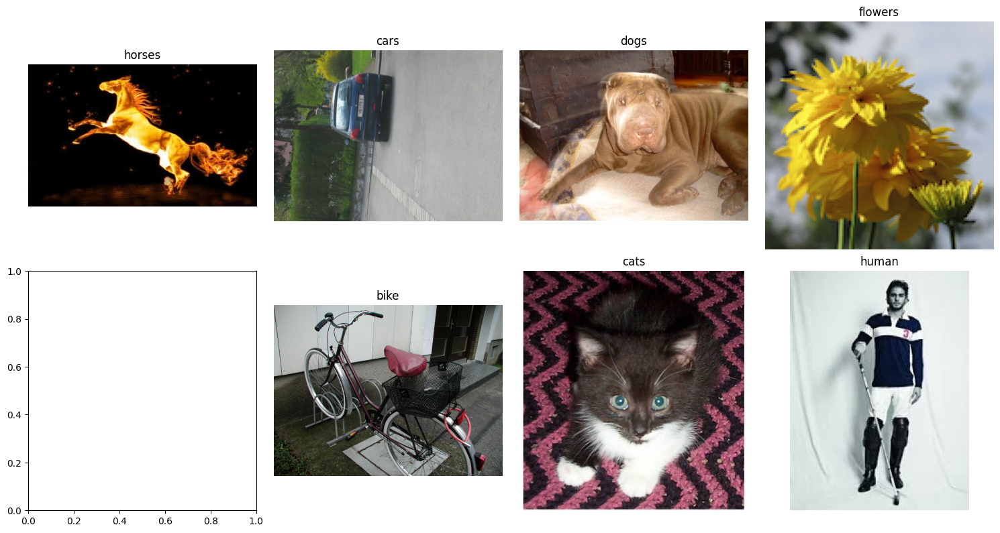

In [14]:
# Define the root directory
data_root = "/kaggle/input/images-dataset/data/data"

# List of subdirectories
subdirs = ['horses', 'cars', 'dogs', 'flowers', 'data', 'bike', 'cats', 'human']

# Determine grid size (number of rows and columns)
n_categories = len(subdirs)
n_cols = 4  # you can change this number based on your preference
n_rows = (n_categories + n_cols - 1) // n_cols

# Create a figure and axis array
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 8))
axes = axes.flatten()

# Display one random image from each category
for i, subdir in enumerate(subdirs):
    subdir_path = os.path.join(data_root, subdir)
    if os.path.isdir(subdir_path):
        image_paths = [os.path.join(subdir_path, img) for img in os.listdir(subdir_path) if os.path.isfile(os.path.join(subdir_path, img))]
        if image_paths:
            img_path = random.choice(image_paths)  # Choose one random image
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].set_title(subdir)
            axes[i].axis('off')
        else:
            axes[i].set_title(f"No images in {subdir}")
            axes[i].axis('off')
    

# Hide any remaining empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


In [8]:
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(degrees=15),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


In [9]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, data_root, transform=None):
        self.data_root = data_root
        self.transform = transform
        self.classes = os.listdir(data_root)
        self.data = []
        for class_idx, class_name in enumerate(self.classes):
            class_dir = os.path.join(data_root, class_name)
            if class_name == "data":
                continue
            for img_filename in os.listdir(class_dir):
                img_dir = os.path.join(class_dir, img_filename)
                img = Image.open(img_dir).convert('RGB')
                if self.transform:
                    img = self.transform(img)
                label = torch.tensor(class_idx, dtype=torch.long)
                self.data.append((img, label))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]

In [11]:
data_samples = CustomDataset(data_root, transform=transform_train)


total_samples = len(data_samples)
train_split = int(0.75 * total_samples)
val_split = int(0.05 * total_samples)
test_split = total_samples - train_split - val_split
train_data, val_data, test_data = random_split(data_samples, [train_split, val_split, test_split])


In [12]:
print(f'Number of Training Samples: {len(train_data):.0f}')
print(f'Number of Validation Samples: {len(val_data):.0f}')
print(f'Number of Testing Samples: {len(test_data):.0f}')

Number of Training Samples: 1352
Number of Validation Samples: 90
Number of Testing Samples: 361


In [13]:
train_loader = DataLoader(train_data, batch_size=64, shuffle=True)
val_loader = DataLoader(val_data, batch_size=16, shuffle=True)
test_loader = DataLoader(test_data, batch_size=16, shuffle=False)

In [14]:
# Load the ResNet-50 model with the appropriate weights
resnet_model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)

# Modify the fully connected layer
num_ftrs = resnet_model.fc.in_features
resnet_model.fc = nn.Linear(num_ftrs, len(data_samples.classes))

# Freeze all layers except for the last block and the fully connected layer
for param in resnet_model.parameters():
    param.requires_grad = False

for param in resnet_model.layer4.parameters():
    param.requires_grad = True
for param in resnet_model.fc.parameters():
    param.requires_grad = True

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 151MB/s] 


In [16]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
resnet_model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resnet_model.parameters(), lr=0.001, momentum=0.9)

Epoch 1, Train Loss: 1.4138, Train Accuracy: 0.5288
Epoch 1, Val Loss: 0.7022, Val Accuracy: 0.9556
Epoch 2, Train Loss: 0.4493, Train Accuracy: 0.9608
Epoch 2, Val Loss: 0.2070, Val Accuracy: 0.9778
Epoch 3, Train Loss: 0.1892, Train Accuracy: 0.9741
Epoch 3, Val Loss: 0.1135, Val Accuracy: 0.9778
Epoch 4, Train Loss: 0.1148, Train Accuracy: 0.9822
Epoch 4, Val Loss: 0.0809, Val Accuracy: 0.9778
Epoch 5, Train Loss: 0.0876, Train Accuracy: 0.9896
Epoch 5, Val Loss: 0.0691, Val Accuracy: 0.9778
Epoch 6, Train Loss: 0.0704, Train Accuracy: 0.9941
Epoch 6, Val Loss: 0.0539, Val Accuracy: 0.9889
Epoch 7, Train Loss: 0.0497, Train Accuracy: 0.9941
Epoch 7, Val Loss: 0.0460, Val Accuracy: 0.9889
Epoch 8, Train Loss: 0.0509, Train Accuracy: 0.9941
Epoch 8, Val Loss: 0.0447, Val Accuracy: 0.9889
Epoch 9, Train Loss: 0.0381, Train Accuracy: 0.9941
Epoch 9, Val Loss: 0.0498, Val Accuracy: 0.9889
Epoch 10, Train Loss: 0.0653, Train Accuracy: 0.9926
Epoch 10, Val Loss: 0.0466, Val Accuracy: 0.988

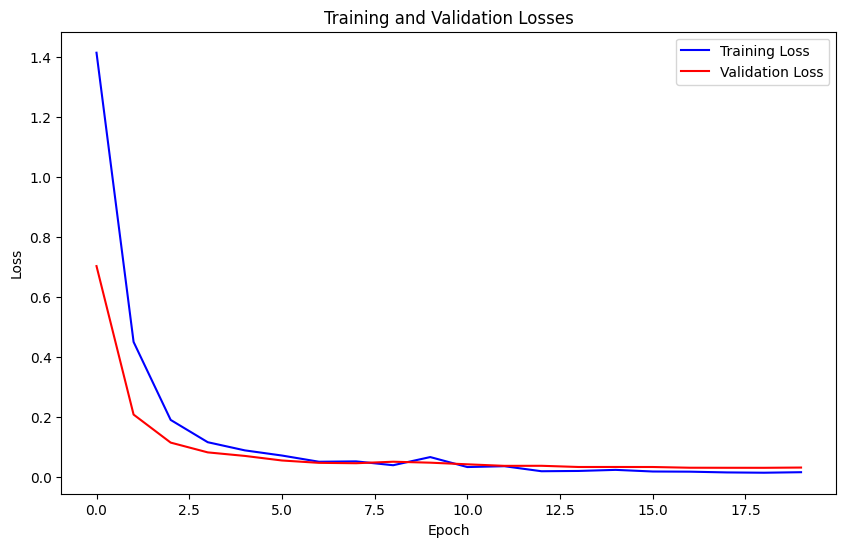

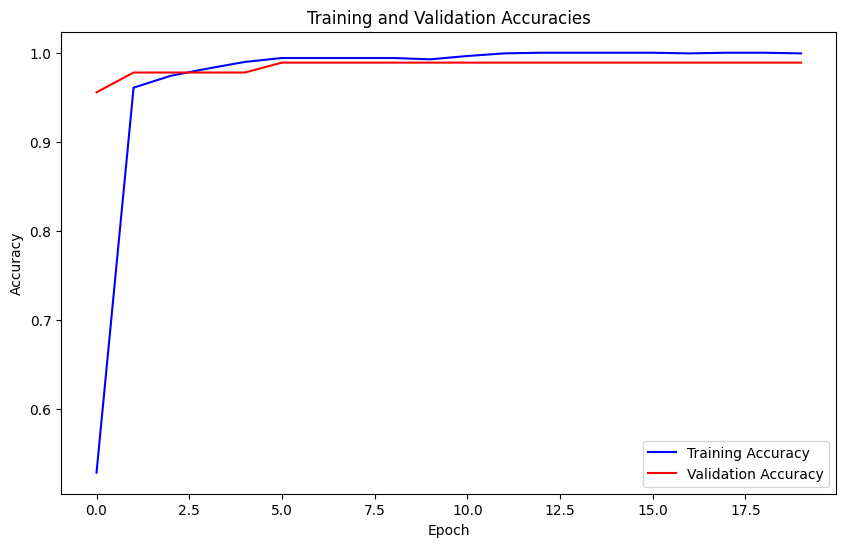

Accuracy: 0.9945
Precision: 0.9947
Recall: 0.9945
F1 Score: 0.9945


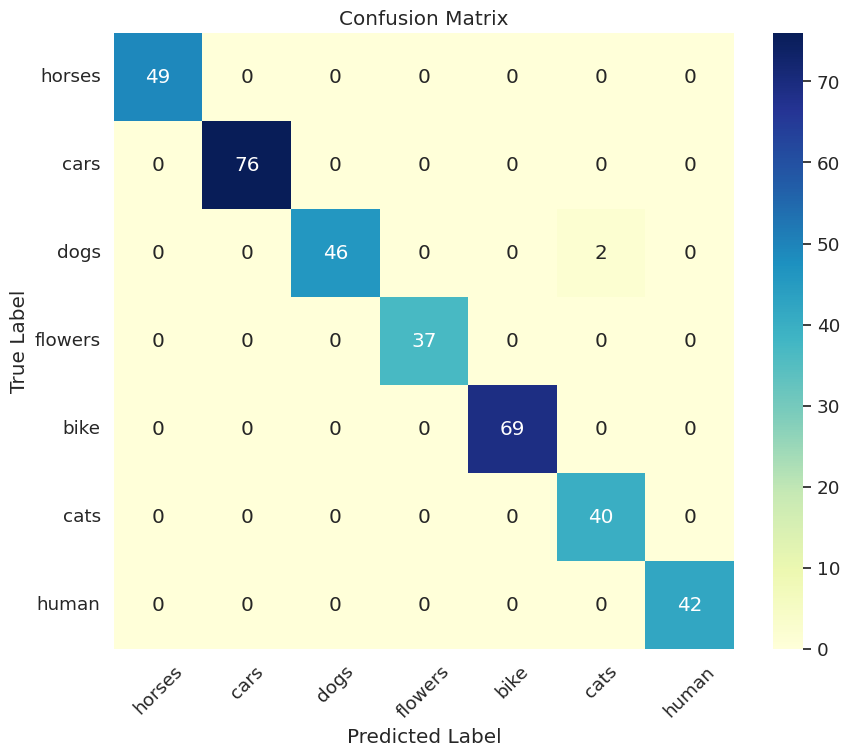

In [17]:
num_epochs = 20
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(num_epochs):
    # Training Phase
    resnet_model.train()
    running_train_loss = 0.0
    correct_train_preds = 0
    total_train_preds = 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = resnet_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_train_loss += loss.item()

        _, predicted = torch.max(outputs, 1)
        correct_train_preds += (predicted == labels).sum().item()
        total_train_preds += labels.size(0)

    avg_train_loss = running_train_loss / len(train_loader)
    train_accuracy = correct_train_preds / total_train_preds
    train_losses.append(avg_train_loss)
    train_accuracies.append(train_accuracy)
    print(f"Epoch {epoch+1}, Train Loss: {avg_train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")

    # Validation Phase
    resnet_model.eval()
    running_val_loss = 0.0
    correct_val_preds = 0
    total_val_preds = 0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = resnet_model(inputs)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            correct_val_preds += (predicted == labels).sum().item()
            total_val_preds += labels.size(0)

    avg_val_loss = running_val_loss / len(val_loader)
    val_accuracy = correct_val_preds / total_val_preds
    val_losses.append(avg_val_loss)
    val_accuracies.append(val_accuracy)
    print(f"Epoch {epoch+1}, Val Loss: {avg_val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")

# After training, plot the losses and accuracies
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Training Loss', color='blue')
plt.plot(val_losses, label='Validation Loss', color='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(train_accuracies, label='Training Accuracy', color='blue')
plt.plot(val_accuracies, label='Validation Accuracy', color='red')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracies')
plt.legend()
plt.show()

# Evaluate the model on the test set
resnet_model.eval()
true_preds = []
preds = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = resnet_model(inputs)
        _, predicted = torch.max(outputs, 1)
        true_preds.extend(labels.tolist())
        preds.extend(predicted.tolist())

# Convert lists to numpy arrays for further processing
true_preds_np = np.array(true_preds)
preds_np = np.array(preds)

# Calculate accuracy, precision, recall, F1 score and confusion matrix
accuracy = accuracy_score(true_preds_np, preds_np)
precision = precision_score(true_preds_np, preds_np, average='weighted')
recall = recall_score(true_preds_np, preds_np, average='weighted')
f1 = f1_score(true_preds_np, preds_np, average='weighted')
conf_matrix = confusion_matrix(true_preds_np, preds_np)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Plot confusion matrix
classes = data_samples.classes
plt.figure(figsize=(10, 8))
sns.set(font_scale=1.2)
sns.heatmap(conf_matrix, annot=True, cmap="YlGnBu", fmt="d", xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()



# **FOR ENCRYPTED IMAGES WITH ELGAMAL ALGORITHM**

In [19]:
data_root = "/kaggle/input/encrypted-images-dataset/images-dataset-encrypted"

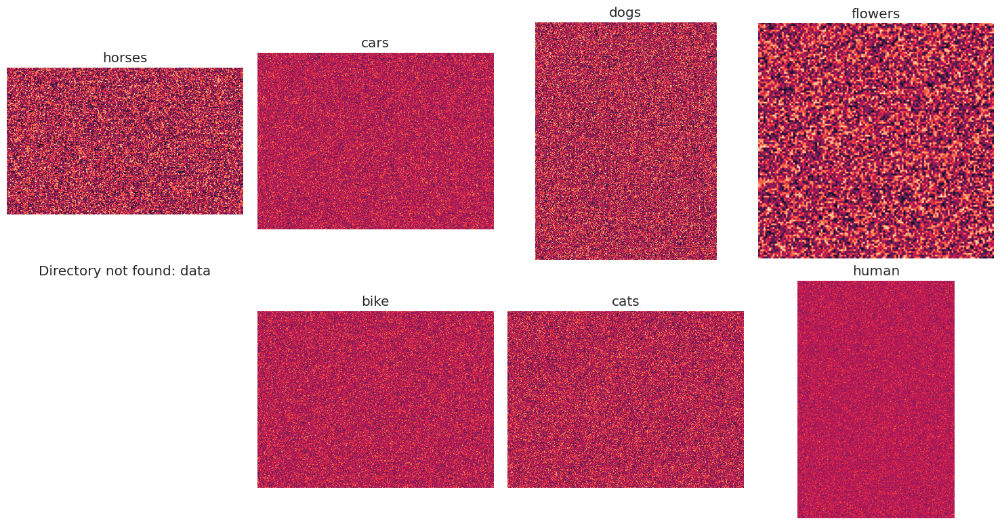

In [20]:
# List of subdirectories
subdirs = ['horses', 'cars', 'dogs', 'flowers', 'data', 'bike', 'cats', 'human']

# Determine grid size (number of rows and columns)
n_categories = len(subdirs)
n_cols = 4  # you can change this number based on your preference
n_rows = (n_categories + n_cols - 1) // n_cols

# Create a figure and axis array
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 8))
axes = axes.flatten()

# Display one random image from each category
for i, subdir in enumerate(subdirs):
    subdir_path = os.path.join(data_root, subdir)
    if os.path.isdir(subdir_path):
        image_paths = [os.path.join(subdir_path, img) for img in os.listdir(subdir_path) if os.path.isfile(os.path.join(subdir_path, img))]
        if image_paths:
            img_path = random.choice(image_paths)  # Choose one random image
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].set_title(subdir)
            axes[i].axis('off')
        else:
            axes[i].set_title(f"No images in {subdir}")
            axes[i].axis('off')
    else:
        axes[i].set_title(f"Directory not found: {subdir}")
        axes[i].axis('off')

# Hide any remaining empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


In [17]:
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(degrees=15),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [18]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, data_root, transform=None):
        self.data_root = data_root
        self.transform = transform
        self.classes = os.listdir(data_root)
        self.data = []
        for class_idx, class_name in enumerate(self.classes):
            class_dir = os.path.join(data_root, class_name)
            if class_name == "data":
                continue
            for img_filename in os.listdir(class_dir):
                img_dir = os.path.join(class_dir, img_filename)
                img = Image.open(img_dir).convert('RGB')
                if self.transform:
                    img = self.transform(img)
                label = torch.tensor(class_idx, dtype=torch.long)
                self.data.append((img, label))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]

In [19]:
data_samples = CustomDataset(data_root, transform=transform_train)


total_samples = len(data_samples)
train_split = int(0.75 * total_samples)
val_split = int(0.05 * total_samples)
test_split = total_samples - train_split - val_split
train_data, val_data, test_data = random_split(data_samples, [train_split, val_split, test_split])


In [20]:
print(f'Number of Training Samples: {len(train_data):.0f}')
print(f'Number of Validation Samples: {len(val_data):.0f}')
print(f'Number of Testing Samples: {len(test_data):.0f}')

Number of Training Samples: 1352
Number of Validation Samples: 90
Number of Testing Samples: 361


In [21]:
train_loader = DataLoader(train_data, batch_size=64, shuffle=True)
val_loader = DataLoader(val_data, batch_size=16, shuffle=True)
test_loader = DataLoader(test_data, batch_size=16, shuffle=False)

In [22]:
resnet_model = models.resnet50(pretrained=True)

num_ftrs = resnet_model.fc.in_features
resnet_model.fc = nn.Linear(num_ftrs, len(data_samples.classes))


for param in resnet_model.parameters():
    param.requires_grad = False

for param in resnet_model.layer4.parameters():
    param.requires_grad = True
for param in resnet_model.fc.parameters():
    param.requires_grad = True


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [23]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
resnet_model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resnet_model.parameters(), lr=0.001, momentum=0.9)


Epoch 1, Train Loss: 1.6642, Train Accuracy: 0.3084
Epoch 1, Val Loss: 1.7953, Val Accuracy: 0.3889
Epoch 2, Train Loss: 1.1194, Train Accuracy: 0.5422
Epoch 2, Val Loss: 1.2080, Val Accuracy: 0.5333
Epoch 3, Train Loss: 0.9602, Train Accuracy: 0.5976
Epoch 3, Val Loss: 0.8442, Val Accuracy: 0.4889
Epoch 4, Train Loss: 0.8164, Train Accuracy: 0.6657
Epoch 4, Val Loss: 0.8150, Val Accuracy: 0.5778
Epoch 5, Train Loss: 0.7482, Train Accuracy: 0.6642
Epoch 5, Val Loss: 0.7701, Val Accuracy: 0.6778
Epoch 6, Train Loss: 0.6801, Train Accuracy: 0.7374
Epoch 6, Val Loss: 0.7560, Val Accuracy: 0.6778
Epoch 7, Train Loss: 0.6620, Train Accuracy: 0.7877
Epoch 7, Val Loss: 0.7461, Val Accuracy: 0.6000
Epoch 8, Train Loss: 0.6079, Train Accuracy: 0.8055
Epoch 8, Val Loss: 0.8131, Val Accuracy: 0.6444
Epoch 9, Train Loss: 0.5029, Train Accuracy: 0.8491
Epoch 9, Val Loss: 0.7414, Val Accuracy: 0.6333
Epoch 10, Train Loss: 0.4679, Train Accuracy: 0.8964
Epoch 10, Val Loss: 0.7849, Val Accuracy: 0.655

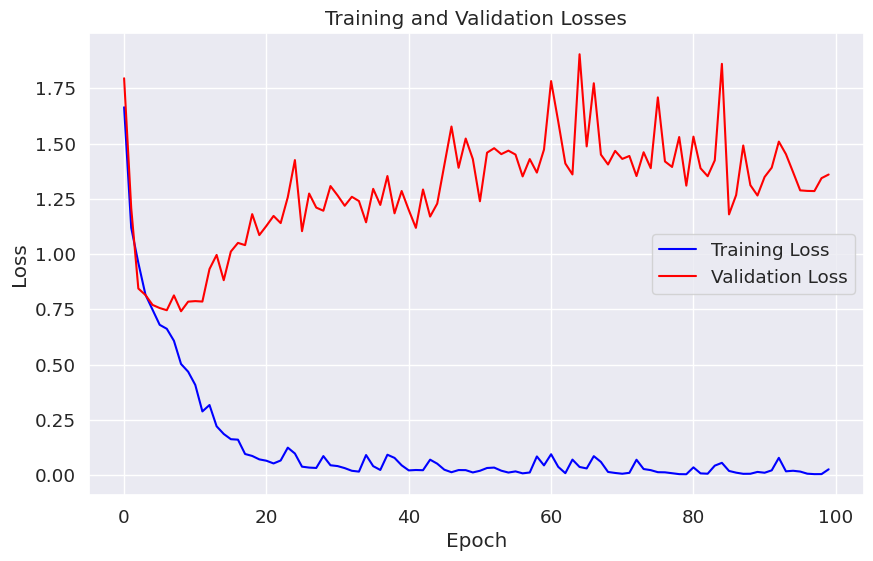

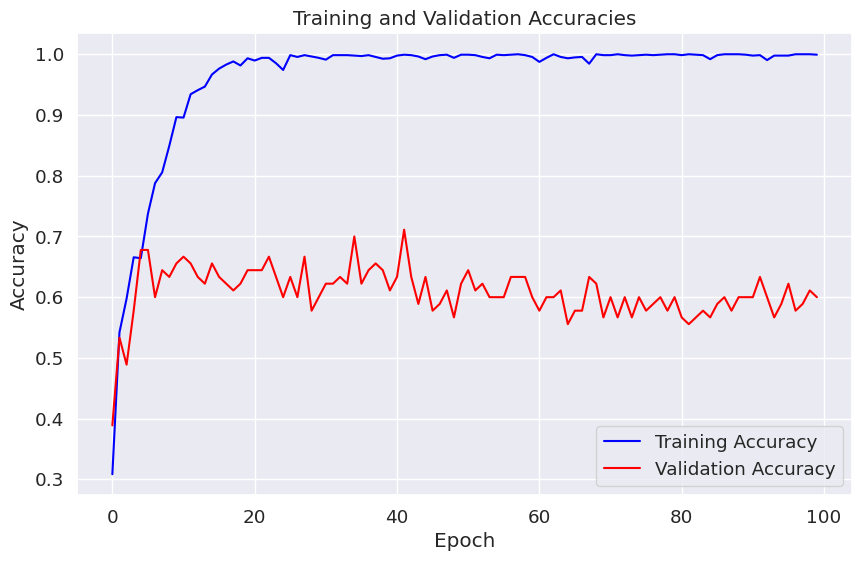

Accuracy: 0.6177
Precision: 0.6119
Recall: 0.6177
F1 Score: 0.6128


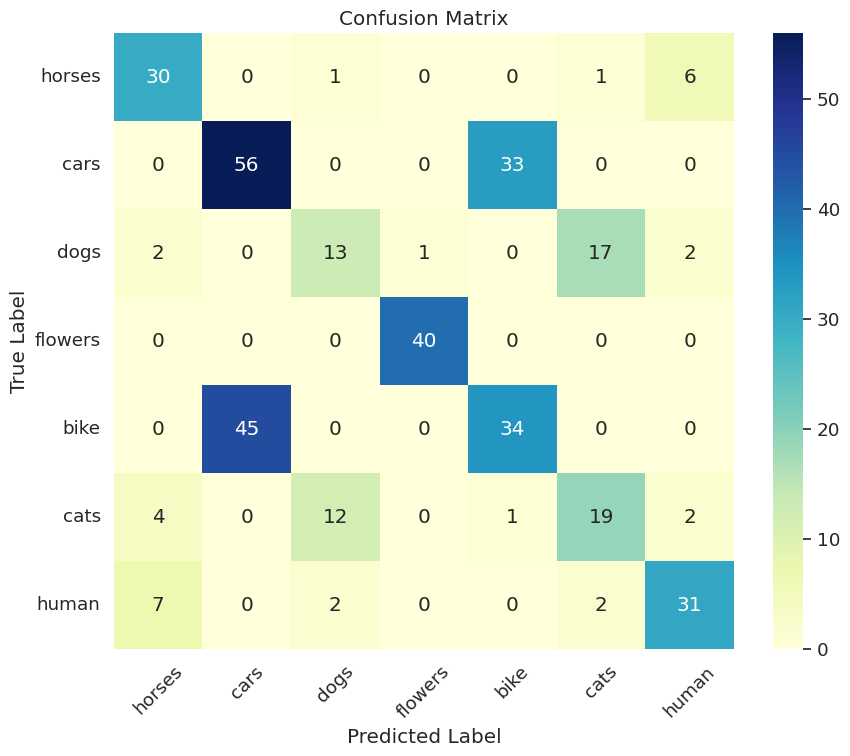

In [24]:
num_epochs = 100
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(num_epochs):
    # Training Phase
    resnet_model.train()
    running_train_loss = 0.0
    correct_train_preds = 0
    total_train_preds = 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = resnet_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_train_loss += loss.item()

        _, predicted = torch.max(outputs, 1)
        correct_train_preds += (predicted == labels).sum().item()
        total_train_preds += labels.size(0)

    avg_train_loss = running_train_loss / len(train_loader)
    train_accuracy = correct_train_preds / total_train_preds
    train_losses.append(avg_train_loss)
    train_accuracies.append(train_accuracy)
    print(f"Epoch {epoch+1}, Train Loss: {avg_train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")

    # Validation Phase
    resnet_model.eval()
    running_val_loss = 0.0
    correct_val_preds = 0
    total_val_preds = 0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = resnet_model(inputs)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            correct_val_preds += (predicted == labels).sum().item()
            total_val_preds += labels.size(0)

    avg_val_loss = running_val_loss / len(val_loader)
    val_accuracy = correct_val_preds / total_val_preds
    val_losses.append(avg_val_loss)
    val_accuracies.append(val_accuracy)
    print(f"Epoch {epoch+1}, Val Loss: {avg_val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")

# After training, plot the losses and accuracies
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Training Loss', color='blue')
plt.plot(val_losses, label='Validation Loss', color='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(train_accuracies, label='Training Accuracy', color='blue')
plt.plot(val_accuracies, label='Validation Accuracy', color='red')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracies')
plt.legend()
plt.show()

# Evaluate the model on the test set
resnet_model.eval()
true_preds = []
preds = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = resnet_model(inputs)
        _, predicted = torch.max(outputs, 1)
        true_preds.extend(labels.tolist())
        preds.extend(predicted.tolist())

# Convert lists to numpy arrays for further processing
true_preds_np = np.array(true_preds)
preds_np = np.array(preds)

# Calculate accuracy, precision, recall, F1 score and confusion matrix
accuracy = accuracy_score(true_preds_np, preds_np)
precision = precision_score(true_preds_np, preds_np, average='weighted')
recall = recall_score(true_preds_np, preds_np, average='weighted')
f1 = f1_score(true_preds_np, preds_np, average='weighted')
conf_matrix = confusion_matrix(true_preds_np, preds_np)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Plot confusion matrix
classes = data_samples.classes
plt.figure(figsize=(10, 8))
sns.set(font_scale=1.2)
sns.heatmap(conf_matrix, annot=True, cmap="YlGnBu", fmt="d", xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()


# **FOR ENCRYPTED IMAGES WITH RSA ALGORITHM**

In [87]:
data_root = "/kaggle/input/images-dataset-encrypted-rsa/images-dataset-encrypted_rsa"

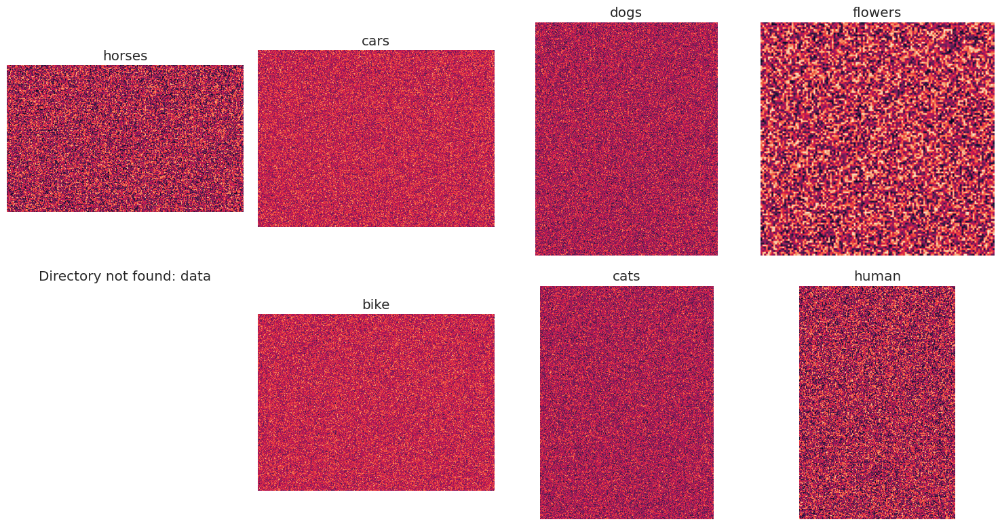

In [88]:
# List of subdirectories
subdirs = ['horses', 'cars', 'dogs', 'flowers', 'data', 'bike', 'cats', 'human']

# Determine grid size (number of rows and columns)
n_categories = len(subdirs)
n_cols = 4  # you can change this number based on your preference
n_rows = (n_categories + n_cols - 1) // n_cols

# Create a figure and axis array
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 8))
axes = axes.flatten()

# Display one random image from each category
for i, subdir in enumerate(subdirs):
    subdir_path = os.path.join(data_root, subdir)
    if os.path.isdir(subdir_path):
        image_paths = [os.path.join(subdir_path, img) for img in os.listdir(subdir_path) if os.path.isfile(os.path.join(subdir_path, img))]
        if image_paths:
            img_path = random.choice(image_paths)  # Choose one random image
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].set_title(subdir)
            axes[i].axis('off')
        else:
            axes[i].set_title(f"No images in {subdir}")
            axes[i].axis('off')
    else:
        axes[i].set_title(f"Directory not found: {subdir}")
        axes[i].axis('off')

# Hide any remaining empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


In [89]:
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(degrees=15),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [90]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, data_root, transform=None):
        self.data_root = data_root
        self.transform = transform
        self.classes = os.listdir(data_root)
        self.data = []
        for class_idx, class_name in enumerate(self.classes):
            class_dir = os.path.join(data_root, class_name)
            if class_name == "data":
                continue
            for img_filename in os.listdir(class_dir):
                img_dir = os.path.join(class_dir, img_filename)
                img = Image.open(img_dir).convert('RGB')
                if self.transform:
                    img = self.transform(img)
                label = torch.tensor(class_idx, dtype=torch.long)
                self.data.append((img, label))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]

In [91]:
data_samples = CustomDataset(data_root, transform=transform_train)


total_samples = len(data_samples)
train_split = int(0.75 * total_samples)
val_split = int(0.05 * total_samples)
test_split = total_samples - train_split - val_split
train_data, val_data, test_data = random_split(data_samples, [train_split, val_split, test_split])


In [92]:
print(f'Number of Training Samples: {len(train_data):.0f}')
print(f'Number of Validation Samples: {len(val_data):.0f}')
print(f'Number of Testing Samples: {len(test_data):.0f}')

Number of Training Samples: 1352
Number of Validation Samples: 90
Number of Testing Samples: 361


In [93]:
train_loader = DataLoader(train_data, batch_size=64, shuffle=True)
val_loader = DataLoader(val_data, batch_size=32, shuffle=True)
test_loader = DataLoader(test_data, batch_size=32, shuffle=False)

In [94]:
resnet_model = models.resnet50(pretrained=True)

num_ftrs = resnet_model.fc.in_features
resnet_model.fc = nn.Linear(num_ftrs, len(data_samples.classes))


for param in resnet_model.parameters():
    param.requires_grad = False

for param in resnet_model.layer4.parameters():
    param.requires_grad = True
for param in resnet_model.fc.parameters():
    param.requires_grad = True


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [95]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
resnet_model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resnet_model.parameters(), lr=0.001, momentum=0.9)

In [96]:
num_epochs = 20
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    # Training Phase
    resnet_model.train()
    running_train_loss = 0.0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = resnet_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_train_loss += loss.item()

    avg_train_loss = running_train_loss / len(train_loader)
    print(f"Epoch {epoch+1}, Train Loss: {avg_train_loss}")
    train_losses.append(avg_train_loss)    

Epoch 1, Train Loss: 1.676897244019942
Epoch 2, Train Loss: 1.0903602757237174
Epoch 3, Train Loss: 0.9089199006557465
Epoch 4, Train Loss: 0.7803743562915109
Epoch 5, Train Loss: 0.7146667865189639
Epoch 6, Train Loss: 0.6663821664723483
Epoch 7, Train Loss: 0.6181645840406418
Epoch 8, Train Loss: 0.5576447912237861
Epoch 9, Train Loss: 0.46116896921938116
Epoch 10, Train Loss: 0.43550441481850366
Epoch 11, Train Loss: 0.34836144609884784
Epoch 12, Train Loss: 0.2739073004234921
Epoch 13, Train Loss: 0.25905874506993726
Epoch 14, Train Loss: 0.15669719603928653
Epoch 15, Train Loss: 0.23028767108917236
Epoch 16, Train Loss: 0.14574679867787796
Epoch 17, Train Loss: 0.09357991365885193
Epoch 18, Train Loss: 0.07415099653669378
Epoch 19, Train Loss: 0.05699183520945636
Epoch 20, Train Loss: 0.08125238501551477


In [97]:
resnet_model.eval()
true_preds = []
preds = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = resnet_model(inputs)
        _, predicted = torch.max(outputs, 1)
        true_preds.extend(labels.tolist())  # Convert tensor to list
        preds.extend(predicted.tolist())  # Convert tensor to list

# Convert lists to numpy arrays for further processing
true_preds_np = np.array(true_preds)
preds_np = np.array(preds)


Accuracy: 0.5706
Precision: 0.5619
Recall: 0.5706
F1 Score: 0.5508


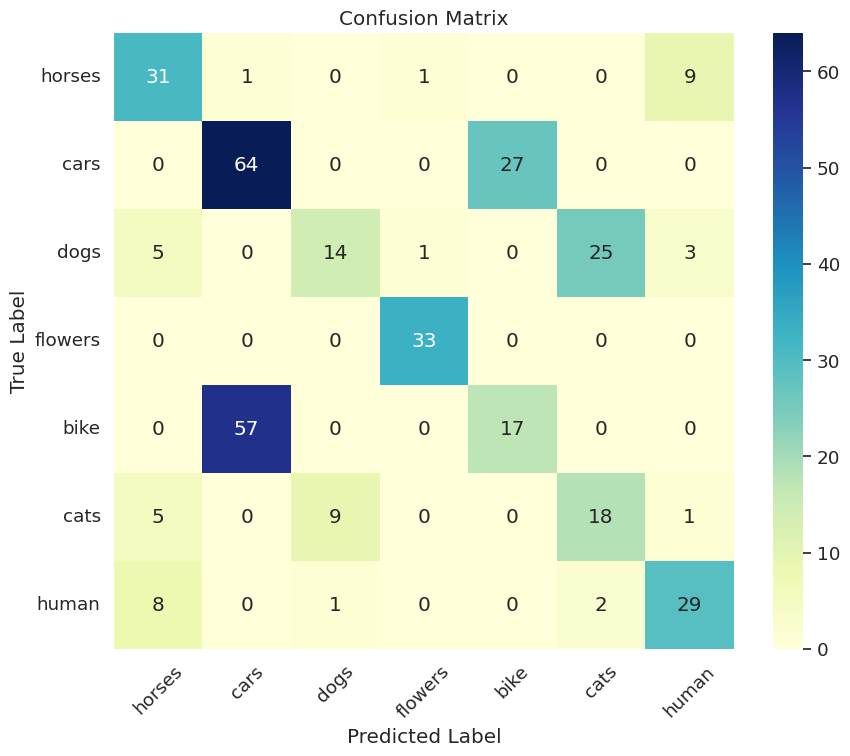

In [98]:
# calculating accuracy , heat map and confusion matrix
accuracy = accuracy_score(true_preds, preds)
precision = precision_score(true_preds, preds, average='weighted')
recall = recall_score(true_preds, preds, average='weighted')
f1 = f1_score(true_preds, preds, average='weighted')
conf_matrix = confusion_matrix(true_preds, preds)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


classes = data_samples.classes
conf_matrix = confusion_matrix(true_preds, preds)


plt.figure(figsize=(10, 8))
sns.set(font_scale=1.2)
sns.heatmap(conf_matrix, annot=True, cmap="YlGnBu", fmt="d", xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

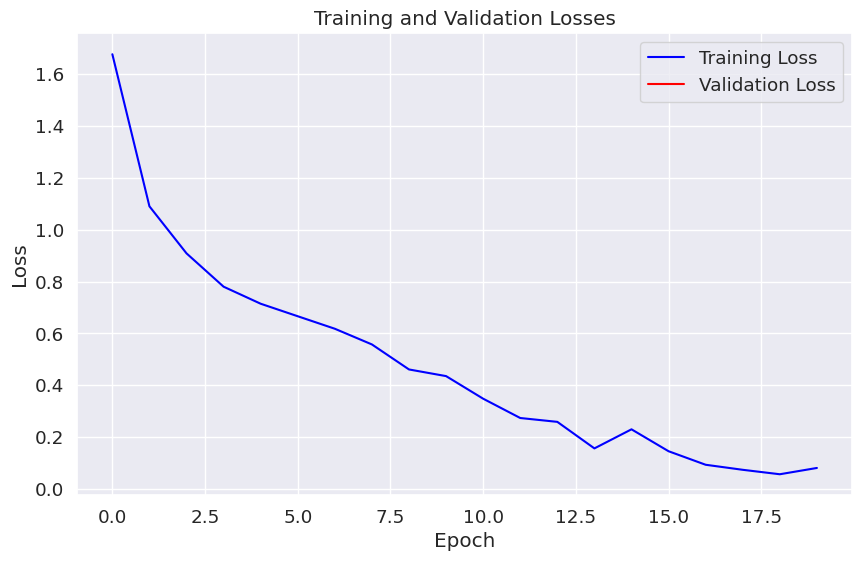

In [99]:
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Training Loss', color='blue')
plt.plot(val_losses, label='Validation Loss', color='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')
plt.legend()
plt.show()

# ELGAMAL1 

In [24]:
data_root = "/kaggle/input/elgamal1/images-dataset-encrypted"

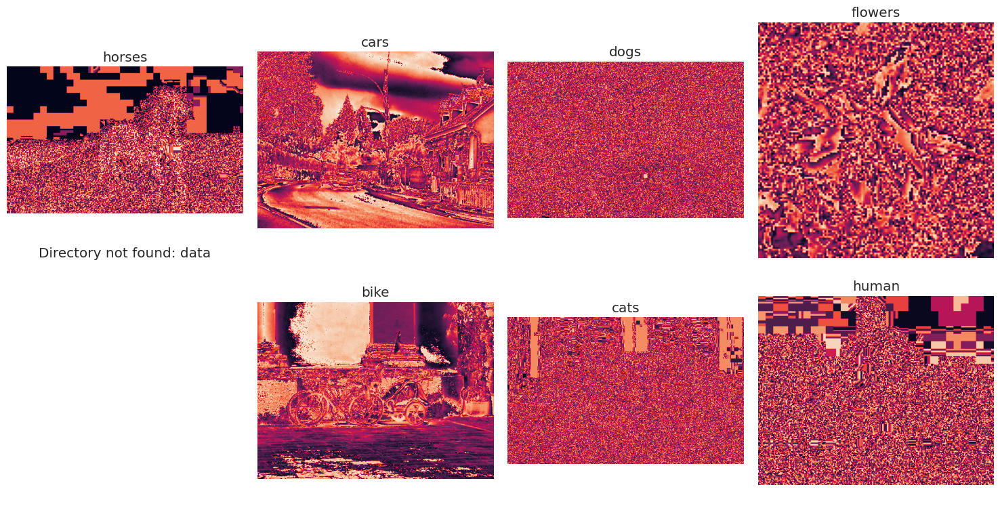

In [25]:
# List of subdirectories
subdirs = ['horses', 'cars', 'dogs', 'flowers', 'data', 'bike', 'cats', 'human']

# Determine grid size (number of rows and columns)
n_categories = len(subdirs)
n_cols = 4  # you can change this number based on your preference
n_rows = (n_categories + n_cols - 1) // n_cols

# Create a figure and axis array
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 8))
axes = axes.flatten()

# Display one random image from each category
for i, subdir in enumerate(subdirs):
    subdir_path = os.path.join(data_root, subdir)
    if os.path.isdir(subdir_path):
        image_paths = [os.path.join(subdir_path, img) for img in os.listdir(subdir_path) if os.path.isfile(os.path.join(subdir_path, img))]
        if image_paths:
            img_path = random.choice(image_paths)  # Choose one random image
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].set_title(subdir)
            axes[i].axis('off')
        else:
            axes[i].set_title(f"No images in {subdir}")
            axes[i].axis('off')
    else:
        axes[i].set_title(f"Directory not found: {subdir}")
        axes[i].axis('off')

# Hide any remaining empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


In [26]:
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(degrees=15),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [30]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, data_root, transform=None):
        self.data_root = data_root
        self.transform = transform
        self.classes = os.listdir(data_root)
        self.data = []
        for class_idx, class_name in enumerate(self.classes):
            class_dir = os.path.join(data_root, class_name)
            if class_name == "data":
                continue
            for img_filename in os.listdir(class_dir):
                img_dir = os.path.join(class_dir, img_filename)
                img = Image.open(img_dir).convert('RGB')
                if self.transform:
                    img = self.transform(img)
                label = torch.tensor(class_idx, dtype=torch.long)
                self.data.append((img, label))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]

In [31]:
data_samples = CustomDataset(data_root, transform=transform_train)


total_samples = len(data_samples)
train_split = int(0.75 * total_samples)
val_split = int(0.05 * total_samples)
test_split = total_samples - train_split - val_split
train_data, val_data, test_data = random_split(data_samples, [train_split, val_split, test_split])


In [32]:
print(f'Number of Training Samples: {len(train_data):.0f}')
print(f'Number of Validation Samples: {len(val_data):.0f}')
print(f'Number of Testing Samples: {len(test_data):.0f}')

Number of Training Samples: 1352
Number of Validation Samples: 90
Number of Testing Samples: 361


In [37]:
train_loader = DataLoader(train_data, batch_size=64, shuffle=True)
val_loader = DataLoader(val_data, batch_size=16, shuffle=True)
test_loader = DataLoader(test_data, batch_size=16, shuffle=False)

In [38]:
resnet_model = models.resnet50(pretrained=True)

num_ftrs = resnet_model.fc.in_features
resnet_model.fc = nn.Linear(num_ftrs, len(data_samples.classes))


for param in resnet_model.parameters():
    param.requires_grad = False

for param in resnet_model.layer4.parameters():
    param.requires_grad = True
for param in resnet_model.fc.parameters():
    param.requires_grad = True


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [39]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
resnet_model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resnet_model.parameters(), lr=0.001, momentum=0.9)

Epoch 1, Train Loss: 1.7286, Train Accuracy: 0.3003
Epoch 1, Val Loss: 1.6776, Val Accuracy: 0.4333
Epoch 2, Train Loss: 1.2612, Train Accuracy: 0.5229
Epoch 2, Val Loss: 1.3840, Val Accuracy: 0.4222
Epoch 3, Train Loss: 0.9843, Train Accuracy: 0.6479
Epoch 3, Val Loss: 1.1328, Val Accuracy: 0.4556
Epoch 4, Train Loss: 0.8401, Train Accuracy: 0.6967
Epoch 4, Val Loss: 0.8256, Val Accuracy: 0.7222
Epoch 5, Train Loss: 0.7147, Train Accuracy: 0.7485
Epoch 5, Val Loss: 0.7950, Val Accuracy: 0.6667
Epoch 6, Train Loss: 0.5942, Train Accuracy: 0.7996
Epoch 6, Val Loss: 0.8121, Val Accuracy: 0.6000
Epoch 7, Train Loss: 0.5323, Train Accuracy: 0.8084
Epoch 7, Val Loss: 0.6980, Val Accuracy: 0.7111
Epoch 8, Train Loss: 0.4422, Train Accuracy: 0.8669
Epoch 8, Val Loss: 0.7067, Val Accuracy: 0.7000
Epoch 9, Train Loss: 0.3877, Train Accuracy: 0.8905
Epoch 9, Val Loss: 0.7705, Val Accuracy: 0.6444
Epoch 10, Train Loss: 0.3387, Train Accuracy: 0.9031
Epoch 10, Val Loss: 0.7061, Val Accuracy: 0.711

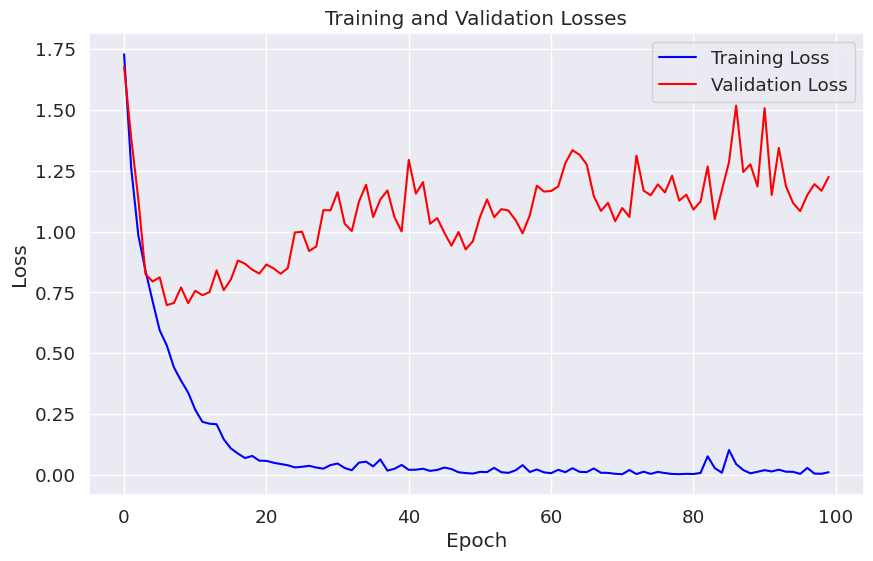

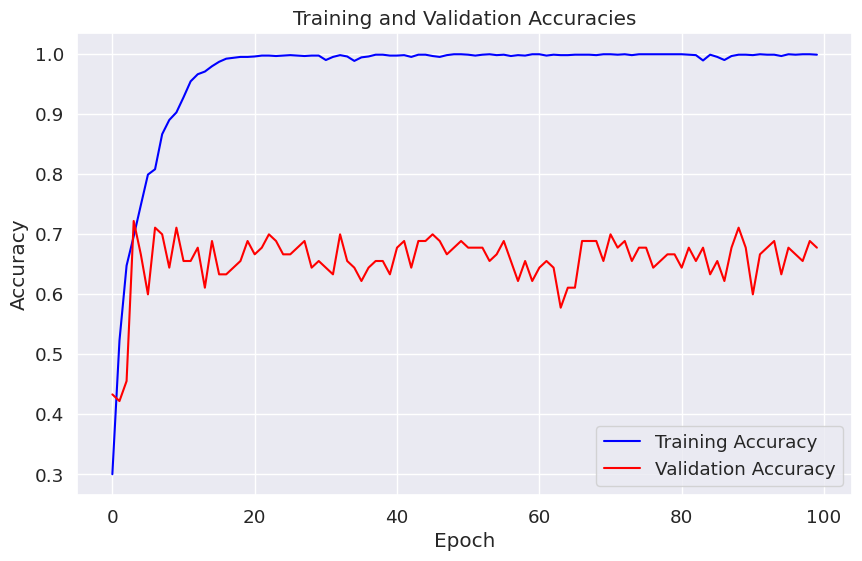

Accuracy: 0.7202
Precision: 0.7238
Recall: 0.7202
F1 Score: 0.7152


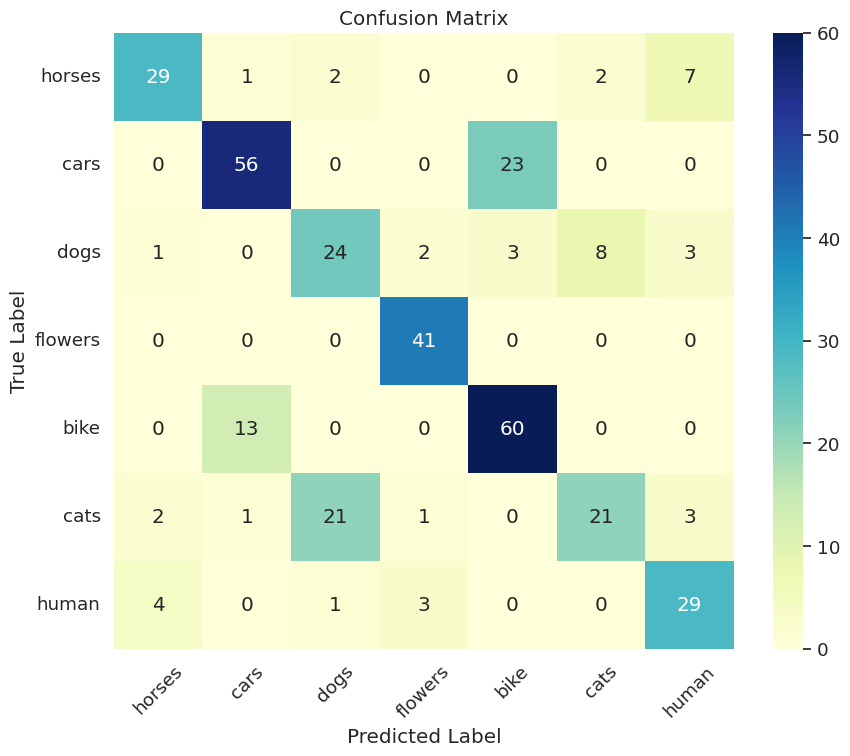

In [40]:
num_epochs = 100
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(num_epochs):
    # Training Phase
    resnet_model.train()
    running_train_loss = 0.0
    correct_train_preds = 0
    total_train_preds = 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = resnet_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_train_loss += loss.item()

        _, predicted = torch.max(outputs, 1)
        correct_train_preds += (predicted == labels).sum().item()
        total_train_preds += labels.size(0)

    avg_train_loss = running_train_loss / len(train_loader)
    train_accuracy = correct_train_preds / total_train_preds
    train_losses.append(avg_train_loss)
    train_accuracies.append(train_accuracy)
    print(f"Epoch {epoch+1}, Train Loss: {avg_train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")

    # Validation Phase
    resnet_model.eval()
    running_val_loss = 0.0
    correct_val_preds = 0
    total_val_preds = 0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = resnet_model(inputs)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            correct_val_preds += (predicted == labels).sum().item()
            total_val_preds += labels.size(0)

    avg_val_loss = running_val_loss / len(val_loader)
    val_accuracy = correct_val_preds / total_val_preds
    val_losses.append(avg_val_loss)
    val_accuracies.append(val_accuracy)
    print(f"Epoch {epoch+1}, Val Loss: {avg_val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")

# After training, plot the losses and accuracies
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Training Loss', color='blue')
plt.plot(val_losses, label='Validation Loss', color='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(train_accuracies, label='Training Accuracy', color='blue')
plt.plot(val_accuracies, label='Validation Accuracy', color='red')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracies')
plt.legend()
plt.show()

# Evaluate the model on the test set
resnet_model.eval()
true_preds = []
preds = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = resnet_model(inputs)
        _, predicted = torch.max(outputs, 1)
        true_preds.extend(labels.tolist())
        preds.extend(predicted.tolist())

# Convert lists to numpy arrays for further processing
true_preds_np = np.array(true_preds)
preds_np = np.array(preds)

# Calculate accuracy, precision, recall, F1 score and confusion matrix
accuracy = accuracy_score(true_preds_np, preds_np)
precision = precision_score(true_preds_np, preds_np, average='weighted')
recall = recall_score(true_preds_np, preds_np, average='weighted')
f1 = f1_score(true_preds_np, preds_np, average='weighted')
conf_matrix = confusion_matrix(true_preds_np, preds_np)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Plot confusion matrix
classes = data_samples.classes
plt.figure(figsize=(10, 8))
sns.set(font_scale=1.2)
sns.heatmap(conf_matrix, annot=True, cmap="YlGnBu", fmt="d", xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()
